In [1]:
from __future__ import print_function
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manualSeed = 111
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [2]:
dataroot = "./pokemon/"

workers = 1
batch_size = 64
nc = 3

nz = 100
ngf = 64
ndf = 64
num_epochs = 600
image_size = 64

Current device : cuda:3


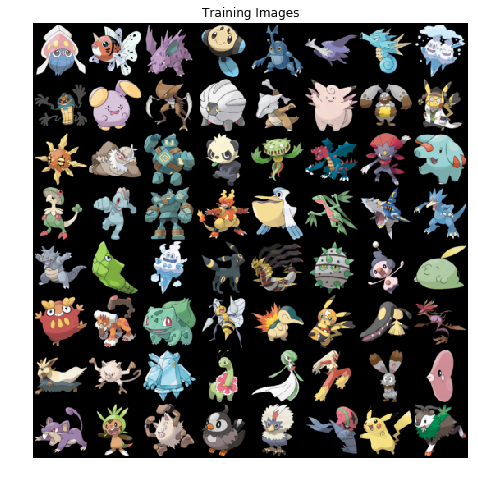

In [3]:
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

DEVICE_ID = 3
device = torch.device(("cuda:%d" % DEVICE_ID) if torch.cuda.is_available() else "cpu")

print("Current device : {}".format(device))

# Выведем трейнсет, дабы убедиться, что все завелось
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [4]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, kernel_size = 4, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf * 8, ngf * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf * 4, ngf * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf * 2, ngf, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf, nc, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [6]:
netG = Generator().to(device)
netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [7]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf, ndf * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            
            nn.Conv2d(ndf * 2, ndf * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 4, ndf * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 8, 1, kernel_size=4, bias=False),
        )

    def forward(self, input):
        return self.main(input)

In [8]:
netD = Discriminator().to(device)
netD.apply(weights_init)

print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)


In [9]:
fixed_noise = torch.randn(8*8, nz, 1, 1, device=device)

lr = 0.00005

optimizerD = optim.RMSprop(netD.parameters(), lr=lr)
optimizerG = optim.RMSprop(netG.parameters(), lr=lr)

In [10]:
def train_D(generator, discriminator, images):
    discriminator.zero_grad()
    generator.zero_grad()
    
    # Real batch
    reals = images[0].to(device)
    
    d_real = discriminator(reals).view(-1)
    real_score = d_real.mean().item()

    # Fake batch
    noise = torch.randn(reals.size(0), nz, 1, 1, device=device)
    fakes = generator(noise)

    d_fake = discriminator(fakes).view(-1)
    fake_score = d_fake.mean().item()
    
    
    d_loss = -(torch.mean(d_real) - torch.mean(d_fake))
    d_loss.backward()
    optimizerD.step()
     
    for p in discriminator.parameters():
        p.data.clamp_(-0.01, 0.01)
    
    return d_loss, real_score, fake_score

In [11]:
def train_G(generator, discriminator):
    discriminator.zero_grad()
    generator.zero_grad()
        
    noise = torch.randn(batch_size, nz, 1, 1, device=device)
    fake = generator(noise)
    d_fake = discriminator(fake).view(-1)
    
    g_loss = -torch.mean(d_fake)
    g_loss.backward()
    optimizerG.step()
    
    return g_loss

In [12]:
img_list = []
G_losses = []
D_losses = []
iters = 0

d_episodes = 4

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader):
        
        for _ in range(d_episodes):
            d_loss, real_score, fake_score = train_D(netG, netD, data)
        g_loss = train_G(netG, netD)
        
        if i % len(dataloader) == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     d_loss.item(), g_loss.item(), real_score, fake_score))

        G_losses.append(g_loss.item())
        D_losses.append(d_loss.item())

        # Сохраняем результат генерации для нашего фиксированного шума
        if (iters % 50 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

[0/600][0/13]	Loss_D: -0.0351	Loss_G: 0.0139	D(x): 0.0219	D(G(z)): -0.0132
[1/600][0/13]	Loss_D: -0.0703	Loss_G: 0.0128	D(x): 0.0621	D(G(z)): -0.0082
[2/600][0/13]	Loss_D: -0.1882	Loss_G: 0.0911	D(x): 0.0335	D(G(z)): -0.1547
[3/600][0/13]	Loss_D: -0.2680	Loss_G: 0.2640	D(x): 0.2138	D(G(z)): -0.0542
[4/600][0/13]	Loss_D: -0.3422	Loss_G: 0.1123	D(x): 0.0634	D(G(z)): -0.2788
[5/600][0/13]	Loss_D: -0.5301	Loss_G: 0.2516	D(x): 0.1820	D(G(z)): -0.3481
[6/600][0/13]	Loss_D: -0.7047	Loss_G: 0.3635	D(x): 0.2986	D(G(z)): -0.4060
[7/600][0/13]	Loss_D: -0.8649	Loss_G: 0.4473	D(x): 0.4089	D(G(z)): -0.4561
[8/600][0/13]	Loss_D: -0.9913	Loss_G: 0.5044	D(x): 0.4707	D(G(z)): -0.5205
[9/600][0/13]	Loss_D: -1.0938	Loss_G: 0.5528	D(x): 0.5387	D(G(z)): -0.5551
[10/600][0/13]	Loss_D: -1.1502	Loss_G: 0.5659	D(x): 0.5624	D(G(z)): -0.5878
[11/600][0/13]	Loss_D: -1.2324	Loss_G: 0.6176	D(x): 0.6171	D(G(z)): -0.6154
[12/600][0/13]	Loss_D: -1.2709	Loss_G: 0.6380	D(x): 0.6336	D(G(z)): -0.6373
[13/600][0/13]	Loss_D:

[108/600][0/13]	Loss_D: -1.1726	Loss_G: 0.5705	D(x): 0.4994	D(G(z)): -0.6731
[109/600][0/13]	Loss_D: -0.9342	Loss_G: 0.3765	D(x): 0.2465	D(G(z)): -0.6877
[110/600][0/13]	Loss_D: -1.2058	Loss_G: 0.5918	D(x): 0.5744	D(G(z)): -0.6315
[111/600][0/13]	Loss_D: -1.1663	Loss_G: 0.5697	D(x): 0.5019	D(G(z)): -0.6644
[112/600][0/13]	Loss_D: -1.2937	Loss_G: 0.6541	D(x): 0.6513	D(G(z)): -0.6425
[113/600][0/13]	Loss_D: -1.2739	Loss_G: 0.6280	D(x): 0.6291	D(G(z)): -0.6448
[114/600][0/13]	Loss_D: -1.0989	Loss_G: 0.5427	D(x): 0.4708	D(G(z)): -0.6282
[115/600][0/13]	Loss_D: -1.2454	Loss_G: 0.6089	D(x): 0.6060	D(G(z)): -0.6394
[116/600][0/13]	Loss_D: -1.2148	Loss_G: 0.6368	D(x): 0.6273	D(G(z)): -0.5875
[117/600][0/13]	Loss_D: -1.0247	Loss_G: 0.3385	D(x): 0.3763	D(G(z)): -0.6484
[118/600][0/13]	Loss_D: -1.2390	Loss_G: 0.5986	D(x): 0.6051	D(G(z)): -0.6340
[119/600][0/13]	Loss_D: -1.1645	Loss_G: 0.5435	D(x): 0.5102	D(G(z)): -0.6543
[120/600][0/13]	Loss_D: -1.0218	Loss_G: 0.2938	D(x): 0.3840	D(G(z)): -0.6378

[215/600][0/13]	Loss_D: -0.9729	Loss_G: 0.4277	D(x): 0.3307	D(G(z)): -0.6421
[216/600][0/13]	Loss_D: -1.0700	Loss_G: 0.4975	D(x): 0.5093	D(G(z)): -0.5607
[217/600][0/13]	Loss_D: -1.0172	Loss_G: 0.4384	D(x): 0.4065	D(G(z)): -0.6107
[218/600][0/13]	Loss_D: -1.0883	Loss_G: 0.4486	D(x): 0.5025	D(G(z)): -0.5858
[219/600][0/13]	Loss_D: -1.0353	Loss_G: 0.6173	D(x): 0.6374	D(G(z)): -0.3980
[220/600][0/13]	Loss_D: -0.7713	Loss_G: 0.6388	D(x): 0.6592	D(G(z)): -0.1121
[221/600][0/13]	Loss_D: -1.0977	Loss_G: 0.5812	D(x): 0.6140	D(G(z)): -0.4837
[222/600][0/13]	Loss_D: -1.0797	Loss_G: 0.6140	D(x): 0.6452	D(G(z)): -0.4345
[223/600][0/13]	Loss_D: -1.0567	Loss_G: 0.5941	D(x): 0.6267	D(G(z)): -0.4300
[224/600][0/13]	Loss_D: -1.0967	Loss_G: 0.5048	D(x): 0.5065	D(G(z)): -0.5902
[225/600][0/13]	Loss_D: -1.1195	Loss_G: 0.5591	D(x): 0.5709	D(G(z)): -0.5486
[226/600][0/13]	Loss_D: -0.5747	Loss_G: 0.6366	D(x): 0.6625	D(G(z)): 0.0878
[227/600][0/13]	Loss_D: -0.7100	Loss_G: 0.6559	D(x): 0.6428	D(G(z)): -0.0672


[322/600][0/13]	Loss_D: -1.0753	Loss_G: 0.5892	D(x): 0.6393	D(G(z)): -0.4360
[323/600][0/13]	Loss_D: -0.6545	Loss_G: 0.0360	D(x): 0.0154	D(G(z)): -0.6391
[324/600][0/13]	Loss_D: -0.8837	Loss_G: 0.2428	D(x): 0.2451	D(G(z)): -0.6386
[325/600][0/13]	Loss_D: -1.0473	Loss_G: 0.4428	D(x): 0.4561	D(G(z)): -0.5913
[326/600][0/13]	Loss_D: -0.8975	Loss_G: 0.6265	D(x): 0.6437	D(G(z)): -0.2538
[327/600][0/13]	Loss_D: -1.0461	Loss_G: 0.5970	D(x): 0.6129	D(G(z)): -0.4332
[328/600][0/13]	Loss_D: -0.6665	Loss_G: 0.6289	D(x): 0.6695	D(G(z)): 0.0031
[329/600][0/13]	Loss_D: -1.0754	Loss_G: 0.5941	D(x): 0.6079	D(G(z)): -0.4676
[330/600][0/13]	Loss_D: -1.0989	Loss_G: 0.5872	D(x): 0.6202	D(G(z)): -0.4787
[331/600][0/13]	Loss_D: -0.8703	Loss_G: 0.1794	D(x): 0.2265	D(G(z)): -0.6437
[332/600][0/13]	Loss_D: -1.1410	Loss_G: 0.5456	D(x): 0.5666	D(G(z)): -0.5744
[333/600][0/13]	Loss_D: -0.9932	Loss_G: 0.6299	D(x): 0.6480	D(G(z)): -0.3451
[334/600][0/13]	Loss_D: -1.0452	Loss_G: 0.6159	D(x): 0.6371	D(G(z)): -0.4081


[429/600][0/13]	Loss_D: -0.8459	Loss_G: 0.6074	D(x): 0.6464	D(G(z)): -0.1995
[430/600][0/13]	Loss_D: -0.9963	Loss_G: 0.5679	D(x): 0.6132	D(G(z)): -0.3831
[431/600][0/13]	Loss_D: -1.0169	Loss_G: 0.5806	D(x): 0.6213	D(G(z)): -0.3956
[432/600][0/13]	Loss_D: -0.9995	Loss_G: 0.5733	D(x): 0.6018	D(G(z)): -0.3977
[433/600][0/13]	Loss_D: -0.9641	Loss_G: 0.6203	D(x): 0.6349	D(G(z)): -0.3292
[434/600][0/13]	Loss_D: -0.8545	Loss_G: 0.5936	D(x): 0.6453	D(G(z)): -0.2092
[435/600][0/13]	Loss_D: -0.8138	Loss_G: 0.6183	D(x): 0.6268	D(G(z)): -0.1871
[436/600][0/13]	Loss_D: -0.7802	Loss_G: 0.6124	D(x): 0.6217	D(G(z)): -0.1585
[437/600][0/13]	Loss_D: -0.9713	Loss_G: 0.5668	D(x): 0.6162	D(G(z)): -0.3551
[438/600][0/13]	Loss_D: -0.9792	Loss_G: 0.5773	D(x): 0.6150	D(G(z)): -0.3642
[439/600][0/13]	Loss_D: -0.8867	Loss_G: 0.5859	D(x): 0.6416	D(G(z)): -0.2451
[440/600][0/13]	Loss_D: -1.0289	Loss_G: 0.5702	D(x): 0.6309	D(G(z)): -0.3980
[441/600][0/13]	Loss_D: -0.9442	Loss_G: 0.5727	D(x): 0.6254	D(G(z)): -0.3187

[536/600][0/13]	Loss_D: -0.9260	Loss_G: 0.3623	D(x): 0.3614	D(G(z)): -0.5647
[537/600][0/13]	Loss_D: -0.9341	Loss_G: 0.4009	D(x): 0.4390	D(G(z)): -0.4951
[538/600][0/13]	Loss_D: -0.8810	Loss_G: 0.3200	D(x): 0.3405	D(G(z)): -0.5405
[539/600][0/13]	Loss_D: -0.8252	Loss_G: 0.2541	D(x): 0.2518	D(G(z)): -0.5735
[540/600][0/13]	Loss_D: -0.8266	Loss_G: 0.2445	D(x): 0.2402	D(G(z)): -0.5865
[541/600][0/13]	Loss_D: -0.8435	Loss_G: 0.3851	D(x): 0.3696	D(G(z)): -0.4739
[542/600][0/13]	Loss_D: -0.8285	Loss_G: 0.2596	D(x): 0.2836	D(G(z)): -0.5449
[543/600][0/13]	Loss_D: -0.8104	Loss_G: 0.0421	D(x): 0.2352	D(G(z)): -0.5752
[544/600][0/13]	Loss_D: -0.7429	Loss_G: 0.2195	D(x): 0.1685	D(G(z)): -0.5744
[545/600][0/13]	Loss_D: -0.9094	Loss_G: 0.2867	D(x): 0.3457	D(G(z)): -0.5637
[546/600][0/13]	Loss_D: -0.8810	Loss_G: 0.3003	D(x): 0.3242	D(G(z)): -0.5568
[547/600][0/13]	Loss_D: -0.8477	Loss_G: 0.2358	D(x): 0.2851	D(G(z)): -0.5626
[548/600][0/13]	Loss_D: -0.8768	Loss_G: 0.2767	D(x): 0.3273	D(G(z)): -0.5495

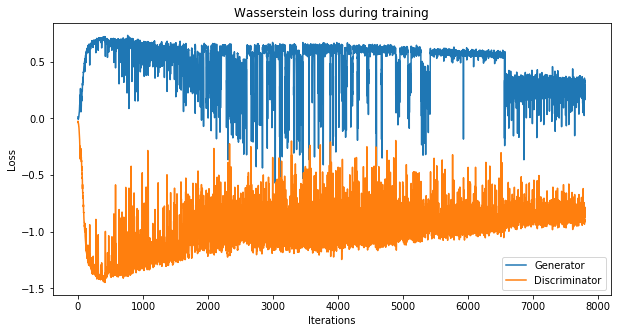

In [13]:
plt.figure(figsize=(10,5))
plt.title("Wasserstein loss during training")
plt.plot(G_losses,label="Generator")
plt.plot(D_losses,label="Discriminator")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

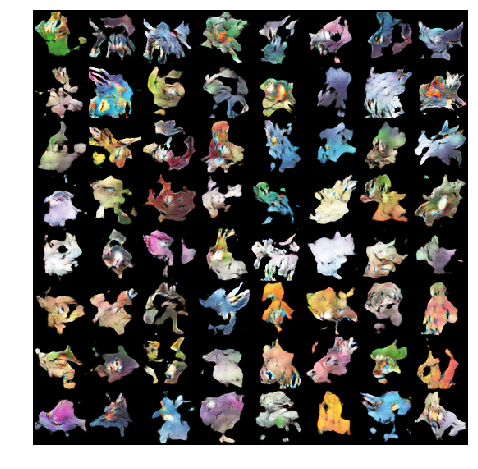

In [14]:
# Проигрываем результаты генерации для фиксированного шума
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list[::6]]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

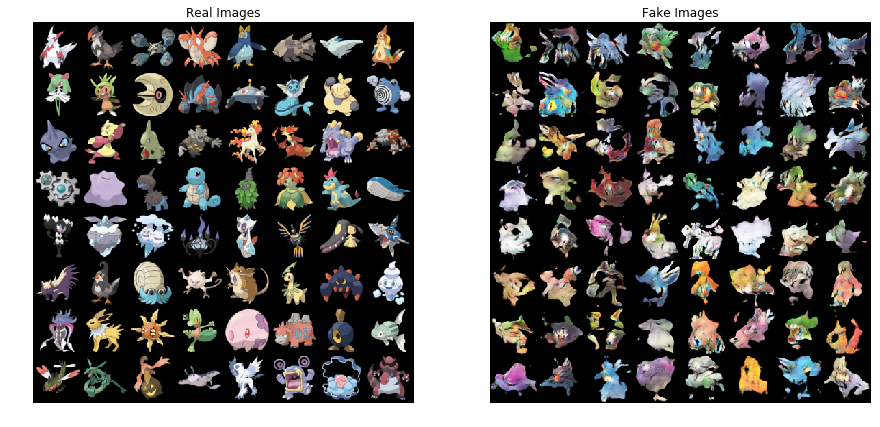

In [15]:
# Сравниваем настоящие данные и генерацию
real_batch = next(iter(dataloader))

# Рисуем трейнсет
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Рисуем фейки
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [16]:
def save_state(network, path='state'):
    torch.save(network.state_dict(), path)

def load_state(class_, path):
    network = class_()
    network.load_state_dict(torch.load(path))
    return network

In [17]:
save_state(netD, './models/netD_v1')
save_state(netG, './models/netG_v1')